<a href="https://colab.research.google.com/github/roblero-gunn/Proyecto1_CoffeeLeafs/blob/main/dev_model/Grad_CAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Paqueterías

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import requests
import os
from io import BytesIO
import shutil
from pathlib import Path
import random as rnd
from glob import glob


In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 71.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44286 sha256=a42ede46d16e32a0b42f3108cc26a3ec52bc78442375223c4a56052f74cbd22e
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [ ]:
# Librerías de explicabilidad (Grad-CAM)
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Rutas
ruta_zip_drive = "/content/drive/MyDrive/Dataset_Maestro_RoCoLe.zip"
ruta_zip_local = "/content/Dataset_Maestro_RoCoLe.zip"
carpeta_destino = "/content/Dataset_Maestro_RoCoLe"

if os.path.exists(ruta_zip_drive):
    # Copiar el ZIP completo desde Drive a la memoria rápida (Evita el error 107)
    print(" 1/2: Copiando el archivo ZIP desde Drive a Colab (esto tomará unos segundos)...")
    shutil.copy2(ruta_zip_drive, ruta_zip_local)

    # Descomprimir el archivo que ya está 100% en la memoria local
    print(" 2/2: Descomprimiendo el archivo local...")
    shutil.unpack_archive(ruta_zip_local, carpeta_destino)

    print(f" ¡Éxito total! Tu dataset está listo en la carpeta '{carpeta_destino}'.")

    # Opcional: Borrar el ZIP local para liberar espacio en RAM
    os.remove(ruta_zip_local)
else:
    print(f"  Error: No se encontró el ZIP en Drive. Asegúrate de que siga ahí.")

 1/2: Copiando el archivo ZIP desde Drive a Colab (esto tomará unos segundos)...
 2/2: Descomprimiendo el archivo local...
 ¡Éxito total! Tu dataset está listo en la carpeta '/content/Dataset_Maestro_RoCoLe'.


# Attention Rollout for Vision Transformers

https://www.kaggle.com/code/arnavs19/attention-rollout-for-vision-transformers

$Attention(Q,K,V) = softmax\left(\frac{QK^T}{\sqrt{d_k}}\right)V$

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 156MB/s]


Imágenes seleccionadas para el lote:
1. /content/Dataset_Maestro_RoCoLe/Sanas/Sana 958.jpg
2. /content/Dataset_Maestro_RoCoLe/Sanas/Sana 23.jpg
3. /content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_131351.jpg
4. /content/Dataset_Maestro_RoCoLe/Sanas/Sana 845.jpg
5. /content/Dataset_Maestro_RoCoLe/Sanas/Sana 511.jpg


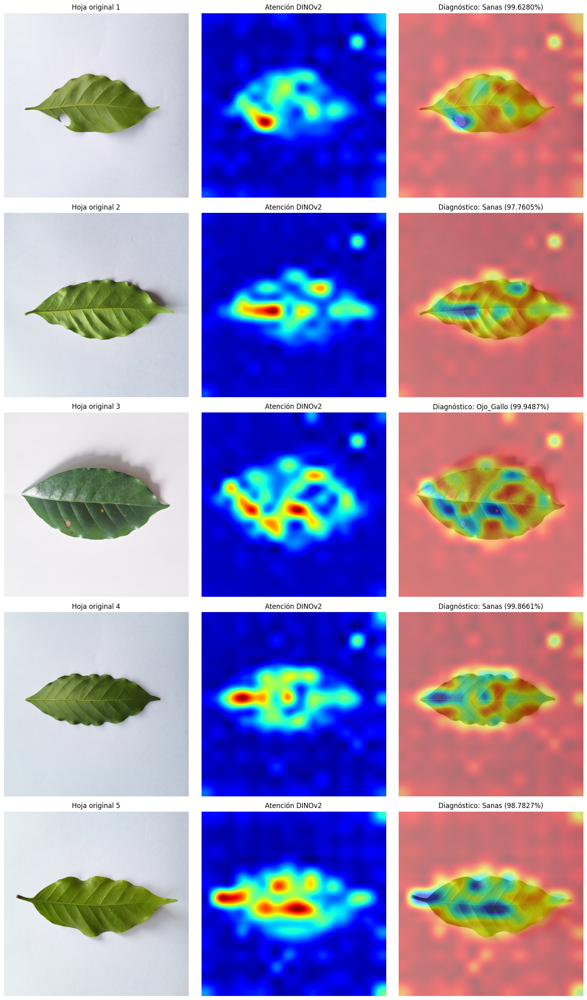

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Diccionario de clases con el orden correcto de ImageFolder
class_names = ['Ojo_Gallo', 'Roya', 'Sanas', 'red_spider_mite']

''' DEFINICIÓN DEL MODELO '''
class ClasificadorCafeDino(nn.Module):
    def __init__(self, num_clases=4):
        super().__init__()
        self.backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
        for param in self.backbone.parameters():
            param.requires_grad = False
        self.cabeza_clasificacion = nn.Linear(384, num_clases)

    def forward(self, x):
        caracteristicas = self.backbone(x)
        resultado = self.cabeza_clasificacion(caracteristicas)
        return resultado

''' EL HOOK PARA INTERCEPTAR QKV '''
class QKVHook:
    def __init__(self):
        self.qkv_out = None

    def __call__(self, module, input, output):
        self.qkv_out = output

''' FUNCIÓN DE BÚSQUEDA DE IMÁGENES (RANDOM) '''
def get_test_images(n=5):
    candidates = []
    preferred_patterns = [
        "/content/Dataset_Descomprimido/*/*.jpg",
        "/content/Dataset_Maestro_RoCoLe/*/*.jpg",
    ]
    for pattern in preferred_patterns:
        candidates.extend(glob(pattern))

    # Quitar duplicados
    unique = list(dict.fromkeys(candidates))

    if len(unique) >= n:
        # elegir 'n' imágenes completamente al azar de la lista
        return rnd.sample(unique, n)
    elif len(unique) > 0:
        print(f"Aviso: Solo se encontraron {len(unique)} imágenes. Las usaremos en orden aleatorio.")
        rnd.shuffle(unique) # Mezcla las pocas que haya
        return unique
    else:
        raise ValueError("No se encontraron imágenes en las rutas especificadas.")

''' FUNCIÓN PARA PROCESAR UNA SOLA IMAGEN '''
def get_attention_maps(model, image_path, hook_handler):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    img_pil = Image.open(image_path).convert('RGB')
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        conf, pred_id = torch.max(probs, 1)
        pred_class = class_names[pred_id.item()]

    # Matemática de Atención Manual
    qkv_output = hook_handler.qkv_out
    B, N, _ = qkv_output.shape
    num_heads = 6
    head_dim = 384 // num_heads

    qkv = qkv_output.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
    q, k = qkv[0], qkv[1]

    scale = head_dim ** -0.5
    attn = (q @ k.transpose(-2, -1)) * scale #Penúltima y última dimensión
    attn_weights = torch.nn.functional.softmax(attn, dim=-1)
    attn_weights = torch.mean(attn_weights, dim=1)

    cls_attention = attn_weights[0, 0, 1:]

    # Redimensionar para visualización
    grid_size = int(np.sqrt(cls_attention.shape[0]))
    attn_map = cls_attention.reshape(grid_size, grid_size).cpu().numpy()

    attn_map_resized = cv2.resize(attn_map, img_pil.size, interpolation=cv2.INTER_CUBIC)
    attn_map_resized = (attn_map_resized - attn_map_resized.min()) / (attn_map_resized.max() - attn_map_resized.min())
    attn_map_255 = (attn_map_resized * 255).astype(np.uint8)

    heatmap = cv2.applyColorMap(attn_map_255, cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_RGB2BGR)

    img_cv2 = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
    overlay = cv2.addWeighted(img_cv2, 0.5, heatmap_rgb, 0.5, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    return img_pil, attn_map_resized, overlay_rgb, pred_class, conf.item()

''' EJECUCIÓN '''

# Cargar modelo
modelo_eval = ClasificadorCafeDino(num_clases=4)
ruta_pesos = '/content/drive/MyDrive/mejor_modelo_dinov2.pth'
modelo_eval.load_state_dict(torch.load(ruta_pesos, map_location=device))
modelo_eval = modelo_eval.to(device)
modelo_eval.eval()

# Conectar el Hook
hook_handler = QKVHook()
last_qkv_layer = modelo_eval.backbone.blocks[-1].attn.qkv
handle = last_qkv_layer.register_forward_hook(hook_handler)

# Obtener imágenes
test_images = get_test_images(n=5)
print("Imágenes seleccionadas para el lote:")
for i, p in enumerate(test_images, 1):
    print(f"{i}. {p}")

# Graficar
fig, axes = plt.subplots(len(test_images), 3, figsize=(15, 5 * len(test_images)))

if len(test_images) == 1:
    axes = np.expand_dims(axes, axis=0)

for row, img_path in enumerate(test_images):
    img_pil, mapa_calor, overlay, pred_class, conf = get_attention_maps(modelo_eval, img_path, hook_handler)

    # 1. Original
    axes[row, 0].imshow(img_pil)
    axes[row, 0].set_title(f"Hoja original {row+1}")
    axes[row, 0].axis("off")

    # 2. Mapa de Calor crudo
    axes[row, 1].imshow(mapa_calor, cmap='jet')
    axes[row, 1].set_title("Atención DINOv2")
    axes[row, 1].axis("off")

    # 3. Superposición con diagnóstico
    axes[row, 2].imshow(overlay)
    axes[row, 2].set_title(f"Diagnóstico: {pred_class} ({conf*100:.4f}%)")
    axes[row, 2].axis("off")

handle.remove() # Limpiar el hook al terminar
plt.tight_layout()
plt.show()

----------------- github --------------------------------

# Grad CAM

In [ ]:
def find_image_path() -> str:
    """Busca una imagen de ejemplo del RoCoLe para ejecutar el notebook sin cambios manuales."""

    # Buscamos en las carpetas que descomprimiste en Colab
    candidates = [
        #"/content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_092220.jpg",
        #"/content/Dataset_Maestro_RoCoLe/Roya 409.jpg",
        "/content/Dataset_Maestro_RoCoLe/Sanas/Sana 94.jpg",
        #"/content/Dataset_Maestro_RoCoLe/red_spider_mite/autoclean_C3P37E2.jpg'
    ]
    for p in candidates:
        if os.path.exists(p):
            return p

    # Búsqueda dinámica en las carpetas típicas de Colab
    for base_dir in ["/content/Dataset_Descomprimido", "/content/Dataset_Maestro_RoCoLe", "./data"]:
        data_dir = Path(base_dir)
        if data_dir.exists():
            for ext in ("*.jpg", "*.jpeg", "*.png"):
                found = list(data_dir.rglob(ext))
                if found:
                    return str(found[0])

    raise FileNotFoundError(
        "No se encontró una imagen válida del RoCoLe. Ajusta image_path a una ruta existente."
    )

def build_input(image_path: str):
    """Prepara la imagen para que la red la entienda (Tensores y Normalización)."""
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ])

    pil_img = Image.open(image_path).convert("RGB")
    rgb_img = np.array(pil_img.resize((224, 224)), dtype=np.float32) / 255.0
    input_tensor = transform(pil_img).unsqueeze(0)
    return rgb_img, input_tensor

def reshape_transform_vit(tensor, height=16, width=16):
    """
    Convierte tokens de DINOv2 [B, N, C] a formato espacial [B, C, H, W].

    NOTA TÉCNICA: DINOv2 Small (vits14) divide la imagen en parches de 14x14 píxeles.
    Para una imagen de 224x224, resultan 224/14 = 16 parches por lado.
    Por eso la salida espacial reconstruida es de 16x16.
    """
    # Descartamos el token 0 (CLS) y nos quedamos con los parches espaciales
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    return result.permute(0, 3, 1, 2)

### Paso 2: Preparar imagen y clase objetivo
En esta etapa cargamos la imagen, la normalizamos y definimos la clase objetivo a explicar.
Para mantener consistencia entre los métodos, usaremos como objetivo la clase que prediga con mayor confianza nuestra CNN (ResNet18) entrenada específicamente para diagnosticar hojas de café.

In [ ]:
# 2) Preparación de entrada y objetivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

image_path = find_image_path()
print(f"Imagen usada: {image_path}")

rgb_img, input_tensor = build_input(image_path)
input_tensor = input_tensor.to(device)

# --- ADAPTACIÓN A TU RESNET18 ---
# 1. Construimos el esqueleto de ResNet18 para 4 clases
cnn_model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
num_ftrs = cnn_model.fc.in_features
cnn_model.fc = torch.nn.Linear(num_ftrs, 4) # 4 clases del RoCoLe
cnn_model = cnn_model.to(device)

# 2. Cargar tus pesos entrenados (¡Ajusta esta ruta a tu archivo .pth!)
ruta_resnet_pesos = '/content/drive/MyDrive/resnet18_rocole_final.pth'
cnn_model.load_state_dict(torch.load(ruta_resnet_pesos, map_location=device))
cnn_model.eval()

# Nombres de las clases de tu proyecto
#class_names = ['Ojo_Gallo', 'red_spider_mite', 'Roya', 'Sanas']
#class_names = ['Roya', 'Sanas', 'Ojo_Gallo', 'red_spider_mite']
class_names = ['Ojo_Gallo', 'Roya', 'Sanas', 'red_spider_mite']
# Inferencia para obtener la predicción
with torch.no_grad():
    logits = cnn_model(input_tensor)

pred_class_idx = int(torch.argmax(logits, dim=1).item())
pred_class_name = class_names[pred_class_idx]

targets = [ClassifierOutputTarget(pred_class_idx)]

print(f"\nClase predicha por ResNet18: {pred_class_name} (Índice: {pred_class_idx})")

Usando dispositivo: cpu
Imagen usada: /content/Dataset_Maestro_RoCoLe/Sanas/Sana 94.jpg
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 152MB/s]



Clase predicha por ResNet18: Sanas (Índice: 2)


### Paso 3: Grad-CAM en CNN (ResNet18)
Grad-CAM calcula un mapa de relevancia usando los gradientes de la clase objetivo sobre la última capa convolucional.
En nuestra CNN (ResNet18), esta capa es el último bloque de `layer4`. Este método suele producir mapas suaves que nos indicarán qué región de la hoja detonó el diagnóstico.

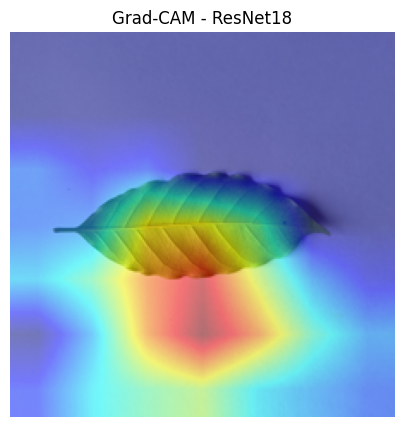

In [ ]:
#  Grad-CAM en CNN (ResNet18)
# Seleccionamos la última capa convolucional de ResNet18
cnn_target_layers = [cnn_model.layer4[-1]]

# Inicializamos Grad-CAM
cnn_gradcam = GradCAM(model=cnn_model, target_layers=cnn_target_layers)

# Calculamos el mapa de calor para la imagen y la clase predicha
cam_cnn_gc = cnn_gradcam(input_tensor=input_tensor, targets=targets)[0, :]

# Superponemos el mapa de calor sobre la imagen original
vis_cnn_gc = show_cam_on_image(rgb_img, cam_cnn_gc, use_rgb=True)

plt.figure(figsize=(5, 5))
plt.imshow(vis_cnn_gc)
plt.title("Grad-CAM - ResNet18")
plt.axis('off')
plt.show()

### Paso 4: Grad-CAM++ en CNN (ResNet18)
Grad-CAM++ extiende la versión original incorporando un cálculo más fino (derivadas de orden superior) para los pesos de los gradientes.
En el contexto del diagnóstico de café, esto es vital: nos ayuda a localizar mejor múltiples lesiones pequeñas simultáneas (como varias manchas separadas de Roya) en lugar de fusionarlas en una sola región difusa.

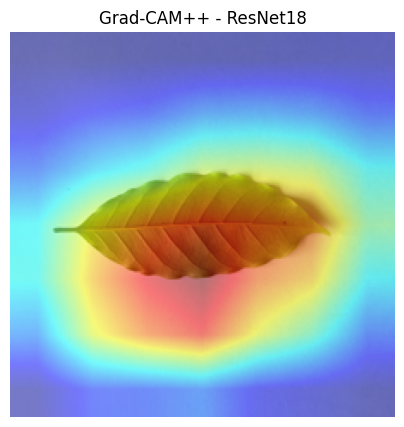

In [ ]:
# Grad-CAM++ en CNN (ResNet18)
# Reutilizamos el modelo y la capa objetivo (layer4[-1])
cnn_gradcampp = GradCAMPlusPlus(model=cnn_model, target_layers=cnn_target_layers)

# Calculamos el mapa de calor mejorado
cam_cnn_gcpp = cnn_gradcampp(input_tensor=input_tensor, targets=targets)[0, :]

# Superponemos el mapa
vis_cnn_gcpp = show_cam_on_image(rgb_img, cam_cnn_gcpp, use_rgb=True)

# Mostrar la imagen
plt.figure(figsize=(5, 5))
plt.imshow(vis_cnn_gcpp)
plt.title("Grad-CAM++ - ResNet18")
plt.axis('off')
plt.show()

### Paso 5: Grad-CAM en Vision Transformer (DINOv2)
A diferencia de las CNN, los Vision Transformers no tienen mapas convolucionales espaciales. Procesan la imagen como una secuencia plana de "tokens" (vectores).
Para poder usar Grad-CAM, empleamos un "truco" (`reshape_transform_vit`) que toma esos tokens, descarta el token global (CLS), y los reacomoda matemáticamente en una cuadrícula 2D (16x16 parches). Así obtenemos un mapa interpretable comparable directamente con el de la CNN.

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


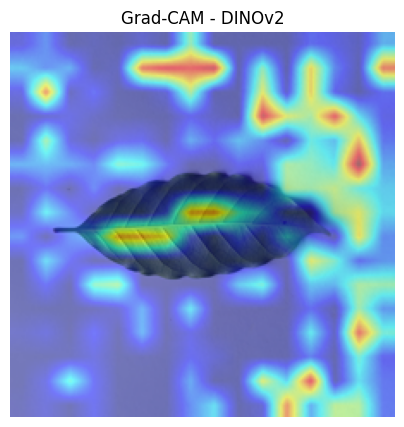

In [ ]:
# Grad-CAM en ViT (DINOv2)

'''DEFINICIÓN DE LA CLASE (CORREGIDA PARA GRAD-CAM) '''
class ClasificadorCafeDino(nn.Module):
    def __init__(self, num_clases=4):
        super().__init__()
        self.backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')

        # ¡CAMBIO CLAVE! Para explicabilidad, NECESITAMOS los gradientes encendidos.
        # Quitamos el param.requires_grad = False
        for param in self.backbone.parameters():
            param.requires_grad = True

        self.cabeza_clasificacion = nn.Linear(384, num_clases)

    def forward(self, x):
        return self.cabeza_clasificacion(self.backbone(x))

# Construir e inicializar el modelo
vit_model = ClasificadorCafeDino(num_clases=4)
ruta_vit_pesos = '/content/drive/MyDrive/mejor_modelo_dinov2.pth'
vit_model.load_state_dict(torch.load(ruta_vit_pesos, map_location=device))
vit_model = vit_model.to(device)

# ASEGURAMOS de que TODO el modelo acepte gradientes
for param in vit_model.parameters():
    param.requires_grad = True

vit_model.eval()

# Definir la capa objetivo para DINOv2
# Usamos la primera capa de normalización del último bloque
vit_target_layers = [vit_model.backbone.blocks[-1].norm1]

# Inicializar Grad-CAM inyectando nuestra función de reshape
vit_gradcam = GradCAM(
    model=vit_model,
    target_layers=vit_target_layers,
    reshape_transform=reshape_transform_vit,
)

# Calcular y superponer el mapa de calor
cam_vit = vit_gradcam(input_tensor=input_tensor, targets=targets)[0, :]
vis_vit_gc = show_cam_on_image(rgb_img, cam_vit, use_rgb=True)

plt.figure(figsize=(5, 5))
plt.imshow(vis_vit_gc)
plt.title("Grad-CAM - DINOv2")
plt.axis('off')
plt.show()

### Paso 6: Comparación final
Aquí comparamos la imagen original de la hoja con los tres mapas de activación.

**Lectura rápida sugerida para el diagnóstico:**
* **Grad-CAM (ResNet18):** Muestra la región general de la hoja que detonó la predicción.
* **Grad-CAM++ (ResNet18):** Focaliza de manera más precisa las lesiones clave, aislando mejor múltiples manchas separadas (ideal para Roya u Ojo de Gallo).
* **Grad-CAM (DINOv2):** Muestra la atención distribuida por parches de 14x14, revelando el contexto global y las relaciones espaciales que analizó el Transformer.

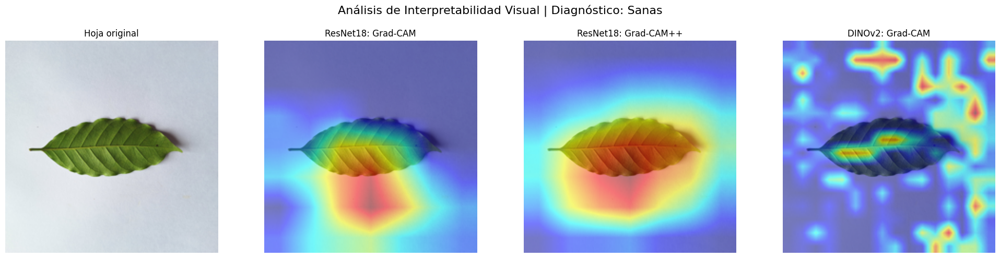

In [ ]:
# Visualización comparativa
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Título global con el diagnóstico que calculamos en el Bloque 2
fig.suptitle(f"Análisis de Interpretabilidad Visual | Diagnóstico: {pred_class_name}", fontsize=16)

axes[0].imshow(rgb_img)
axes[0].set_title("Hoja original")
axes[0].axis("off")

axes[1].imshow(vis_cnn_gc)
axes[1].set_title("ResNet18: Grad-CAM")
axes[1].axis("off")

axes[2].imshow(vis_cnn_gcpp)
axes[2].set_title("ResNet18: Grad-CAM++")
axes[2].axis("off")

axes[3].imshow(vis_vit_gc)
axes[3].set_title("DINOv2: Grad-CAM")
axes[3].axis("off")

# tight_layout con un pequeño ajuste arriba (rect) para que no choque con el suptitle
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Paso 7: Evaluación en lote (Batch de 5 imágenes)
En este paso ejecutamos el mismo proceso automáticamente sobre un lote de 5 imágenes variadas del dataset RoCoLe.
Para cada hoja mostramos:
* Imagen original
* ResNet18: Grad-CAM
* ResNet18: Grad-CAM++
* DINOv2: Grad-CAM

Imágenes seleccionadas para el lote:
1. /content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_091427.jpg
2. /content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_130850.jpg
3. /content/Dataset_Maestro_RoCoLe/Roya/Roya 1585.jpg
4. /content/Dataset_Maestro_RoCoLe/Roya/Roya 980.jpg
5. /content/Dataset_Maestro_RoCoLe/Sanas/Sana 674.jpg


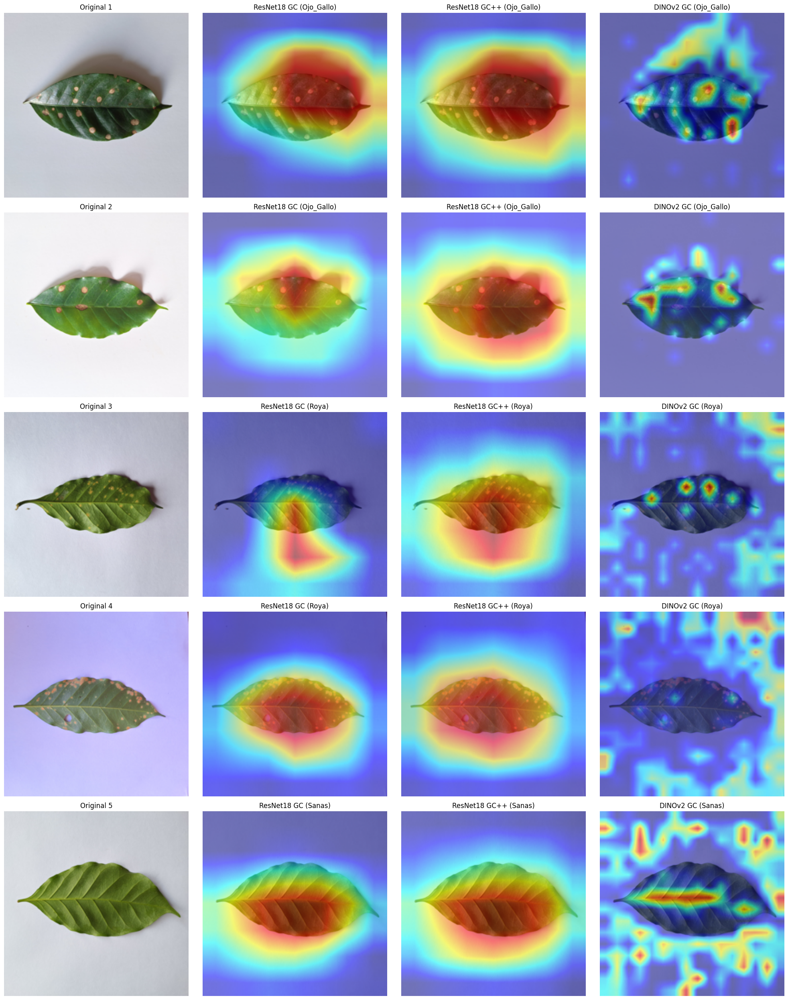

In [ ]:
# Batch de 5 imágenes de prueba
from glob import glob

def get_test_images(n=5):
    candidates = []

    # Buscamos en las carpetas de RoCoLe descomprimidas en Colab
    preferred_patterns = [
        "/content/Dataset_Descomprimido/*/*.jpg",
        "/content/Dataset_Maestro_RoCoLe/*/*.jpg",
    ]
    for pattern in preferred_patterns:
        candidates.extend(sorted(glob(pattern)))

    # Quitar duplicados preservando orden
    unique = list(dict.fromkeys(candidates))

    if len(unique) >= n:
        # Damos "saltos" en la lista para tomar imágenes de diferentes carpetas/clases
        step = max(1, len(unique) // n)
        return unique[0:n*step:step][:n]
    elif len(unique) > 0:
        print(f"Aviso: Solo se encontraron {len(unique)} imágenes. Usaremos esas.")
        return unique
    else:
        raise ValueError("No se encontraron imágenes en las rutas especificadas. ¡Asegúrate de descomprimir el dataset!")

test_images = get_test_images(n=5)
print("Imágenes seleccionadas para el lote:")
for i, p in enumerate(test_images, 1):
    print(f"{i}. {p}")

# Crear la figura (n filas, 4 columnas)
fig, axes = plt.subplots(len(test_images), 4, figsize=(20, 5 * len(test_images)))

# Si por alguna razón solo hay 1 imagen, ajustamos las dimensiones para que no falle
if len(test_images) == 1:
    axes = np.expand_dims(axes, axis=0)

for row, img_path in enumerate(test_images):
    rgb_img_i, input_tensor_i = build_input(img_path)
    input_tensor_i = input_tensor_i.to(device)

    # Inferencia con ResNet18 para obtener la clase objetivo
    with torch.no_grad():
        logits_i = cnn_model(input_tensor_i)

    pred_i = int(torch.argmax(logits_i, dim=1).item())
    pred_class_name_i = class_names[pred_i] # Obtenemos el nombre real de la enfermedad
    targets_i = [ClassifierOutputTarget(pred_i)]

    # Calcular los tres mapas de calor
    cam_cnn_gc_i = cnn_gradcam(input_tensor=input_tensor_i, targets=targets_i)[0, :]
    cam_cnn_gcpp_i = cnn_gradcampp(input_tensor=input_tensor_i, targets=targets_i)[0, :]
    cam_vit_i = vit_gradcam(input_tensor=input_tensor_i, targets=targets_i)[0, :]

    # Superponer mapas sobre la imagen original
    vis_cnn_gc_i = show_cam_on_image(rgb_img_i, cam_cnn_gc_i, use_rgb=True)
    vis_cnn_gcpp_i = show_cam_on_image(rgb_img_i, cam_cnn_gcpp_i, use_rgb=True)
    vis_vit_gc_i = show_cam_on_image(rgb_img_i, cam_vit_i, use_rgb=True)

    # Graficar 1: Original
    axes[row, 0].imshow(rgb_img_i)
    axes[row, 0].set_title(f"Original {row+1}")
    axes[row, 0].axis("off")

    # Graficar 2: ResNet18 Grad-CAM
    axes[row, 1].imshow(vis_cnn_gc_i)
    axes[row, 1].set_title(f"ResNet18 GC ({pred_class_name_i})")
    axes[row, 1].axis("off")

    # Graficar 3: ResNet18 Grad-CAM++
    axes[row, 2].imshow(vis_cnn_gcpp_i)
    axes[row, 2].set_title(f"ResNet18 GC++ ({pred_class_name_i})")
    axes[row, 2].axis("off")

    # Graficar 4: DINOv2 Grad-CAM
    axes[row, 3].imshow(vis_vit_gc_i)
    axes[row, 3].set_title(f"DINOv2 GC ({pred_class_name_i})")
    axes[row, 3].axis("off")

plt.tight_layout()
plt.show()

# Grad CAM (Capas anteriores)

In [ ]:
from pathlib import Path

def find_weights_path() -> Path:
    """Busca los pesos de ResNet18 en ubicaciones comunes del proyecto."""
    candidates = [
        Path('/content/drive/MyDrive/resnet18_rocole_final.pth')
    ]
    for p in candidates:
        if p.exists():
            return p.resolve()
    raise FileNotFoundError(
        "No se encontró resnet18_rocole_final.pth. Debe estar en la raíz del proyecto."
    )

def build_input_from_pil(pil_img: Image.Image):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ])

    rgb_img = np.array(pil_img.resize((224, 224)), dtype=np.float32) / 255.0
    input_tensor = transform(pil_img).unsqueeze(0)
    return rgb_img, input_tensor

def build_leaf_mask_and_crop(
    pil_img: Image.Image,
    pad_ratio: float = 0.08,
    bg_color=(128, 128, 128),
):
    """Genera máscara de hoja, recorte con padding y recorte enmascarado con fondo neutro."""
    img_rgb = np.array(pil_img)
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

    # Rango amplio para verdes y amarillos de hoja
    lower = np.array([20, 20, 20], dtype=np.uint8)
    upper = np.array([95, 255, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)

    kernel = np.ones((7, 7), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        h, w = mask.shape
        fallback_mask = np.ones((h, w), dtype=np.uint8) * 255
        return fallback_mask, pil_img, pil_img, (0, 0, w, h)

    cnt = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(cnt)

    # Más padding para conservar contexto útil cercano a la hoja
    pad = int(pad_ratio * max(w, h))
    x0 = max(0, x - pad)
    y0 = max(0, y - pad)
    x1 = min(mask.shape[1], x + w + pad)
    y1 = min(mask.shape[0], y + h + pad)

    crop_rgb = img_rgb[y0:y1, x0:x1]
    crop_mask = mask[y0:y1, x0:x1]

    # Fondo neutro para reducir sesgo de contexto
    bg = np.full_like(crop_rgb, bg_color, dtype=np.uint8)
    crop_masked = crop_rgb.copy()
    crop_masked[crop_mask == 0] = bg[crop_mask == 0]

    pil_crop = Image.fromarray(crop_rgb)
    pil_crop_masked = Image.fromarray(crop_masked)
    return mask, pil_crop, pil_crop_masked, (x0, y0, x1 - x0, y1 - y0)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

weights_path = find_weights_path()

preferred_image_candidates = [
    Path('/content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_091427.jpg')
]

image_path = None
for candidate in preferred_image_candidates:
    if candidate.exists():
        image_path = candidate.resolve()
        break

if image_path is None:
    raise FileNotFoundError(
        "No se encontró 'Roya 1001.jpg' en la raíz del proyecto."
    )

print(f"Pesos usados: {weights_path}")
print(f"Imagen usada: {image_path}")

# Sin recorte: entrada directa con imagen completa
pil_img_full = Image.open(image_path).convert("RGB")
rgb_img, input_tensor = build_input_from_pil(pil_img_full)
input_tensor = input_tensor.to(device)

cnn_model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
num_ftrs = cnn_model.fc.in_features
cnn_model.fc = torch.nn.Linear(num_ftrs, 4)
cnn_model.load_state_dict(torch.load(weights_path, map_location=device))
cnn_model = cnn_model.to(device)
cnn_model.eval()

class_names = ['Ojo_Gallo', 'Roya', 'Sanas', 'red_spider_mite']

with torch.no_grad():
    logits = cnn_model(input_tensor)
    probs = torch.softmax(logits, dim=1)
    pred_class_idx = int(torch.argmax(probs, dim=1).item())
    pred_conf = float(probs[0, pred_class_idx].item())

pred_class_name = class_names[pred_class_idx]
targets = [ClassifierOutputTarget(pred_class_idx)]

print(f"Clase predicha: {pred_class_name} ({pred_conf*100:.2f}%)")

Usando dispositivo: cpu
Pesos usados: /content/drive/MyDrive/resnet18_rocole_final.pth
Imagen usada: /content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_091427.jpg
Clase predicha: Ojo_Gallo (99.98%)


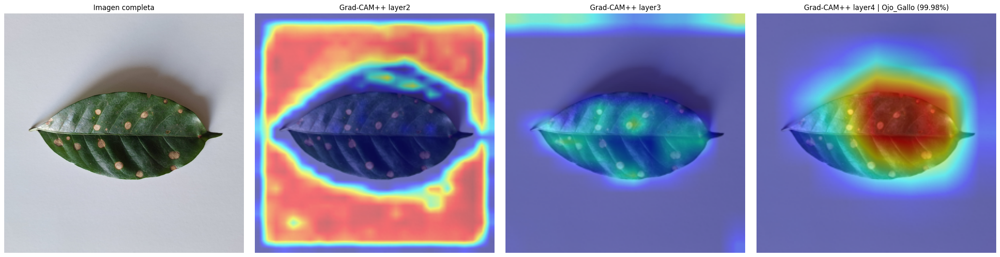

In [ ]:
# Instanciar los objetos Grad-CAM++ para cada capa (añadiendo layer4)
cam_layer4 = GradCAMPlusPlus(model=cnn_model, target_layers=[cnn_model.layer4[-1]])
cam_layer3 = GradCAMPlusPlus(model=cnn_model, target_layers=[cnn_model.layer3[-1]])
cam_layer2 = GradCAMPlusPlus(model=cnn_model, target_layers=[cnn_model.layer2[-1]])

# Calcular las activaciones con suavizado
cam_gcpp_l4 = cam_layer4(
    input_tensor=input_tensor,
    targets=targets,
    aug_smooth=True,
    eigen_smooth=True,
)[0, :]

cam_gcpp_l3 = cam_layer3(
    input_tensor=input_tensor,
    targets=targets,
    aug_smooth=True,
    eigen_smooth=True,
)[0, :]

cam_gcpp_l2 = cam_layer2(
    input_tensor=input_tensor,
    targets=targets,
    aug_smooth=True,
    eigen_smooth=True,
)[0, :]

# Mezclar los mapas de calor con la imagen original en formato RGB
vis_l4 = show_cam_on_image(rgb_img, cam_gcpp_l4, use_rgb=True)
vis_l3 = show_cam_on_image(rgb_img, cam_gcpp_l3, use_rgb=True)
vis_l2 = show_cam_on_image(rgb_img, cam_gcpp_l2, use_rgb=True)

# Configurar el plot (Cambiamos a 1 fila y 4 columnas, ajustando el figsize)
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

# Columna 0: Entrada original
axes[0].imshow(pil_img_full)
axes[0].set_title("Imagen completa")
axes[0].axis('off')

# Columna 1: Características de nivel medio
axes[1].imshow(vis_l2)
axes[1].set_title("Grad-CAM++ layer2")
axes[1].axis('off')

# Columna 2: Características de nivel alto / semántico
axes[2].imshow(vis_l3)
axes[2].set_title("Grad-CAM++ layer3")
axes[2].axis('off')

# Columna 3: Características finales + Clasificación (Capa más profunda)
axes[3].imshow(vis_l4)
axes[3].set_title(f"Grad-CAM++ layer4 | {pred_class_name} ({pred_conf*100:.2f}%)")
axes[3].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def procesar_lista_gradcam(lista_rutas_imagenes, model, transform, device):
    model.to(device)
    model.eval()

    target_layers_l2 = [model.layer2[-1]]
    target_layers_l3 = [model.layer3[-1]]
    target_layers_l4 = [model.layer4[-1]]

    for ruta_img in lista_rutas_imagenes:
        if not os.path.exists(ruta_img):
            print(f"Archivo no encontrado: {ruta_img}")
            continue

        pil_img = Image.open(ruta_img).convert('RGB')
        input_tensor = transform(pil_img).unsqueeze(0).to(device)
        rgb_img = np.float32(pil_img.resize((224, 224))) / 255.0

        with torch.no_grad():
            output = model(input_tensor)
            probabilities = torch.softmax(output, dim=1)[0]
            pred_class_idx = torch.argmax(probabilities).item()
            pred_conf = probabilities[pred_class_idx].item()
            pred_class_name = f"Clase {pred_class_idx}"

        targets = None

        with GradCAMPlusPlus(model=model, target_layers=target_layers_l2) as cam_l2, \
             GradCAMPlusPlus(model=model, target_layers=target_layers_l3) as cam_l3, \
             GradCAMPlusPlus(model=model, target_layers=target_layers_l4) as cam_l4:

            cam_gcpp_l2 = cam_l2(input_tensor=input_tensor, targets=targets, aug_smooth=True, eigen_smooth=True)[0, :]
            cam_gcpp_l3 = cam_l3(input_tensor=input_tensor, targets=targets, aug_smooth=True, eigen_smooth=True)[0, :]
            cam_gcpp_l4 = cam_l4(input_tensor=input_tensor, targets=targets, aug_smooth=True, eigen_smooth=True)[0, :]

        vis_l2 = show_cam_on_image(rgb_img, cam_gcpp_l2, use_rgb=True)
        vis_l3 = show_cam_on_image(rgb_img, cam_gcpp_l3, use_rgb=True)
        vis_l4 = show_cam_on_image(rgb_img, cam_gcpp_l4, use_rgb=True)

        fig, axes = plt.subplots(1, 4, figsize=(24, 6))

        axes[0].imshow(pil_img.resize((224, 224)))
        axes[0].set_title(f"Original: {os.path.basename(ruta_img)}")
        axes[0].axis('off')

        axes[1].imshow(vis_l2)
        axes[1].set_title("Grad-CAM++ layer2")
        axes[1].axis('off')

        axes[2].imshow(vis_l3)
        axes[2].set_title("Grad-CAM++ layer3")
        axes[2].axis('off')

        axes[3].imshow(vis_l4)
        axes[3].set_title(f"Grad-CAM++ layer4 | {pred_class_name} ({pred_conf*100:.2f}%)")
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()

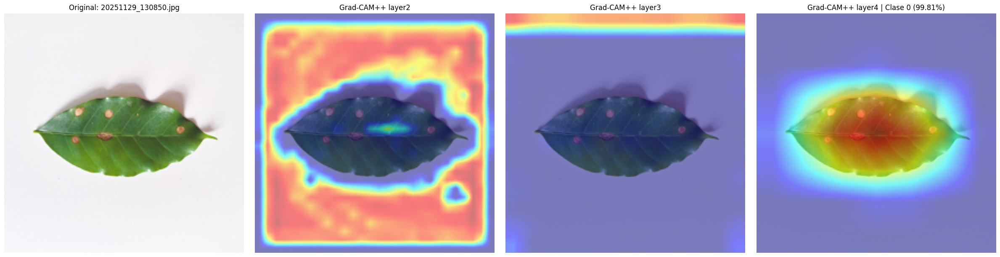

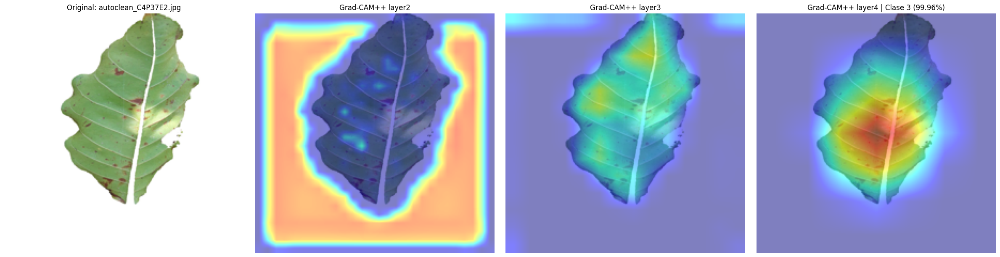

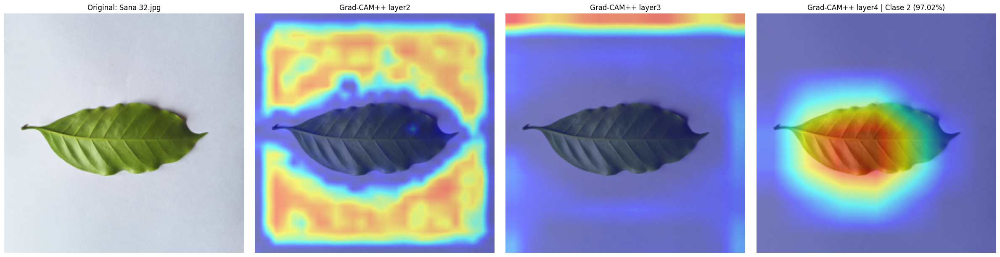

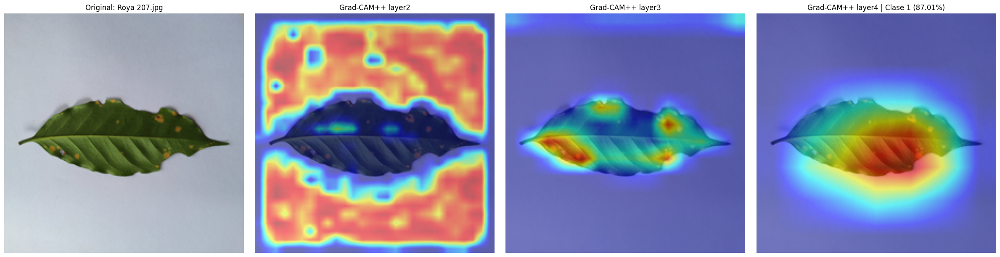

In [ ]:
# Rutas de las imágenes que quieres evaluar
mis_imagenes = [
    "/content/Dataset_Maestro_RoCoLe/Ojo_Gallo/20251129_130850.jpg",
    "/content/Dataset_Maestro_RoCoLe/red_spider_mite/autoclean_C4P37E2.jpg",
    "/content/Dataset_Maestro_RoCoLe/Sanas/Sana 32.jpg",
    "/content/Dataset_Maestro_RoCoLe/Roya/Roya 207.jpg"
]

# Configura el dispositivo (usa GPU si está disponible)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Definir las transformaciones (mismas que en el entrenamiento)
# NOTA: Grad-CAM requiere que las dimensiones finales coincidan (ej. 224x224)
from torchvision import transforms
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

procesar_lista_gradcam(
    lista_rutas_imagenes=mis_imagenes,
    model=cnn_model,
    transform=data_transforms,
    device=device
)

# DINOv2 Diferentes capas

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Evaluando imagen: /content/Dataset_Maestro_RoCoLe/Roya/Roya 1270.jpg


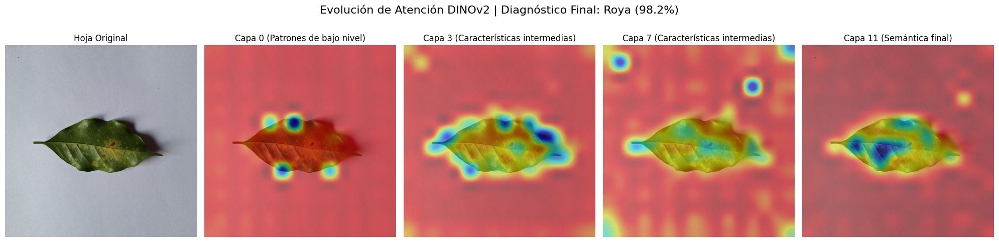

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class_names = ['Ojo_Gallo', 'Roya', 'Sanas', 'red_spider_mite']

''' DEFINICIÓN DEL MODELO '''
class ClasificadorCafeDino(nn.Module):
    def __init__(self, num_clases=4):
        super().__init__()
        self.backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
        for param in self.backbone.parameters():
            param.requires_grad = False
        self.cabeza_clasificacion = nn.Linear(384, num_clases)

    def forward(self, x):
        return self.cabeza_clasificacion(self.backbone(x))

''' HOOK MÚLTIPLE (Guarda varias capas a la vez) '''
class MultiQKVHook:
    def __init__(self):
        self.qkv_outs = {} # Diccionario para guardar salidas por número de capa

    def get_hook(self, layer_idx):
        # Esta función crea un espía personalizado para cada capa
        def hook(module, input, output):
            self.qkv_outs[layer_idx] = output
        return hook

''' BÚSQUEDA DE UNA IMAGEN RANDOM '''
def get_single_random_image():
    candidates = []
    preferred_patterns = [
        "/content/Dataset_Descomprimido/*/*.jpg",
        "/content/Dataset_Maestro_RoCoLe/*/*.jpg",
    ]
    for pattern in preferred_patterns:
        candidates.extend(glob(pattern))

    unique = list(dict.fromkeys(candidates))
    if len(unique) > 0:
        return rnd.choice(unique)
    else:
        raise ValueError("No se encontraron imágenes. ¡Revisa las rutas!")

''' FUNCIÓN MATEMÁTICA PARA MÚLTIPLES CAPAS '''
def get_multi_layer_attention(model, image_path, hook_handler, capas):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    img_pil = Image.open(image_path).convert('RGB')
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        conf, pred_id = torch.max(probs, 1)
        pred_class = class_names[pred_id.item()]

    overlays = {}

    # Iteramos sobre cada capa que el "espía" interceptó
    for layer_idx in capas:
        qkv_output = hook_handler.qkv_outs[layer_idx]
        B, N, _ = qkv_output.shape
        num_heads = 6
        head_dim = 384 // num_heads

        # Gimnasia de Tensores
        qkv = qkv_output.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
        q, k = qkv[0], qkv[1]

        # Ecuación de Atención: Q * K^T
        scale = head_dim ** -0.5
        attn = (q @ k.transpose(-2, -1)) * scale

        # Softmax y Promedio de Cabezas
        attn_weights = torch.nn.functional.softmax(attn, dim=-1)
        attn_weights = torch.mean(attn_weights, dim=1)

        # Extraemos cómo vio la imagen el Token CLS en ESTA capa específica
        cls_attention = attn_weights[0, 0, 1:]

        # Redimensionar y crear mapa de calor
        grid_size = int(np.sqrt(cls_attention.shape[0]))
        attn_map = cls_attention.reshape(grid_size, grid_size).cpu().numpy()

        attn_map_resized = cv2.resize(attn_map, img_pil.size, interpolation=cv2.INTER_CUBIC)
        # Normalización suave para evitar que capas intermedias se vean negras
        attn_map_resized = (attn_map_resized - attn_map_resized.min()) / (attn_map_resized.max() - attn_map_resized.min() + 1e-8)
        attn_map_255 = (attn_map_resized * 255).astype(np.uint8)

        heatmap = cv2.applyColorMap(attn_map_255, cv2.COLORMAP_JET)
        heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_RGB2BGR)

        img_cv2 = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR)
        overlay = cv2.addWeighted(img_cv2, 0.5, heatmap_rgb, 0.5, 0)
        overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

        overlays[layer_idx] = overlay_rgb

    return img_pil, overlays, pred_class, conf.item()

''' EJECUCIÓN Y VISUALIZACIÓN '''

# Inicializar modelo
modelo_eval = ClasificadorCafeDino(num_clases=4)
ruta_pesos = '/content/drive/MyDrive/mejor_modelo_dinov2.pth'
modelo_eval.load_state_dict(torch.load(ruta_pesos, map_location=device))
modelo_eval = modelo_eval.to(device)
modelo_eval.eval()

# Capas que queremos visualizar
capas_a_visualizar = [0, 3, 7, 11]
hook_handler = MultiQKVHook()
handles = []

# Conectamos un espía a cada capa seleccionada
for i in capas_a_visualizar:
    layer_qkv = modelo_eval.backbone.blocks[i].attn.qkv
    handle = layer_qkv.register_forward_hook(hook_handler.get_hook(i))
    handles.append(handle)

# Tomamos una imagen al azar y calculamos
imagen_azar = get_single_random_image()
print(f"Evaluando imagen: {imagen_azar}")

img_pil, overlays, pred_class, conf = get_multi_layer_attention(modelo_eval, imagen_azar, hook_handler, capas_a_visualizar)

# Limpiamos los espías de la memoria
for handle in handles:
    handle.remove()

# Graficar la evolución
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
fig.suptitle(f"Evolución de Atención DINOv2 | Diagnóstico Final: {pred_class} ({conf*100:.1f}%)", fontsize=16)

# Columna 1: Original
axes[0].imshow(img_pil)
axes[0].set_title("Hoja Original")
axes[0].axis("off")

# Columna 2: Capa 0
axes[1].imshow(overlays[0])
axes[1].set_title("Capa 0 (Patrones de bajo nivel)")
axes[1].axis("off")

# Columna 3: Capa 5
axes[2].imshow(overlays[3])
axes[2].set_title("Capa 3 (Características intermedias)")
axes[2].axis("off")

axes[3].imshow(overlays[7])
axes[3].set_title("Capa 7 (Características intermedias)")
axes[3].axis("off")

# Columna 4: Capa 11
axes[4].imshow(overlays[11])
axes[4].set_title("Capa 11 (Semántica final)")
axes[4].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()